# Base

In [2]:
from PIL import ImageGrab
from IPython.display import display, Image
def ins(ratio=1.0):
 im_data = ImageGrab.grabclipboard()
 new_size = tuple([int(i*ratio) for i in im_data.size])
 thumb = im_data.resize(new_size)
 fn = "temp.PNG"
 thumb.save(fn)
 img = Image(filename=fn)
 display(img)
import random
import itertools as it
import numpy as np
##############
from scipy.stats import * # Основная библиотека в этом семестре
############################
from sympy import *
from scipy.special import *
import math
############################
from tqdm.notebook import tqdm
# Настройка графика
import matplotlib.pyplot as plt # Основная библиотека
import matplotlib.ticker as ticker
from matplotlib import rcParams
#########################
import locale
locale.setlocale(locale.LC_NUMERIC, 'russian')
plt.rcParams['axes.formatter.use_locale'] = True
#########
#########
plt.rcParams['font.size'] = 36
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['mathtext.fontset'] = 'cm'
###################
def plot_geom(condition,N=15000,reverse=0):
    rcParams['figure.figsize'] = (5, 5)
    rcParams['figure.dpi'] = 200
    fig,ax =plt.subplots(figsize=(5, 5))
    plt.tick_params(labelsize = 16)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(0.1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
    plt.xlim(0,1)
    plt.ylim(0,1)
    ax.set_aspect('equal', adjustable='box')
    U1=uniform() # создаем равномерное (непрерывное) распределение на отрезке [0;1]
    U2=uniform()
    count=0
    for i in tqdm(range(N)):
        x = U1.rvs(size=1)[0]
        y = U2.rvs(size=1)[0]
        if reverse and y>=x:
            y=1-y
            x=1-x
        if condition(x,y): 
            plt.plot(x,y,marker='.', markersize=1,color ='r')
            count+=1
        else:
            plt.plot(x,y,marker='.', markersize=1,color ='gray')
    pstat = count/N
    print(pstat)
    return plt.show()
def plot_stat(condition,N=1000000):
    count=0
    x=[]
    y=[]
    for i in tqdm(range(N)):
        x.append(i+1)
        x1 = random.uniform(0,1)
        y1 = random.uniform(0,1)
        if condition(x1,y1):
            count+=1
        y.append(count/(i+1))
    pstat=count/N
    pstat
    rcParams['figure.figsize'] = (15, 10)
    rcParams['figure.dpi'] = 300
    fig,ax =plt.subplots(figsize=(30, 10))
    plt.tick_params(labelsize = 36)

    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.005))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(15))
    ax.xaxis.set_minor_locator(ticker.MaxNLocator(8))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_minor_locator(ticker.MaxNLocator(8))
    plt.ylim(pstat-0.005,pstat+0.005)
    plt.xlim(0.1,N)

    plt.grid(color='DarkTurquoise', alpha=0.75, linestyle=':', linewidth=1)
    plt.plot(x,y,color='b',lw=3)
    plt.plot(x,[pstat]*len(x),color='r',lw=2)
    plt.show()
    print(pstat)
def make_plot(countr, x, y, N = 10**6):
    pstat = countr/N
    rcParams['figure.figsize'] = (15, 10)
    rcParams['figure.dpi'] = 300
    fig,ax =plt.subplots(figsize=(30, 10))
    plt.tick_params(labelsize = 36)
    plt.grid(color='DarkTurquoise', alpha=0.75, linestyle=':', linewidth=1)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.005))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(15))
    ax.xaxis.set_minor_locator(ticker.MaxNLocator(8))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_minor_locator(ticker.MaxNLocator(8))
    plt.ylim(pstat-0.005,pstat+0.005)
    plt.xlim(0,N)
    plt.plot(x,y,color='b',lw=3)
    plt.plot(x,[pstat]*len(x),color='r',lw=2)
    plt.show()

# 2.13.


5 мужчин и 5 женщин случайным образом рассаживаются в ряд на 10 мест. Найдите вероятности следующих событий: A – любые две женщины не сидят рядом; B – все мужчины сидят рядом;

Пространство Омега равно 10!
<br>Тогда, пространство А = 6*5!*5! = 86400, а B численно равно A
<br>86400/10! = 1/42

## A – любые две женщины не сидят рядом

  0%|          | 0/999999 [00:00<?, ?it/s]

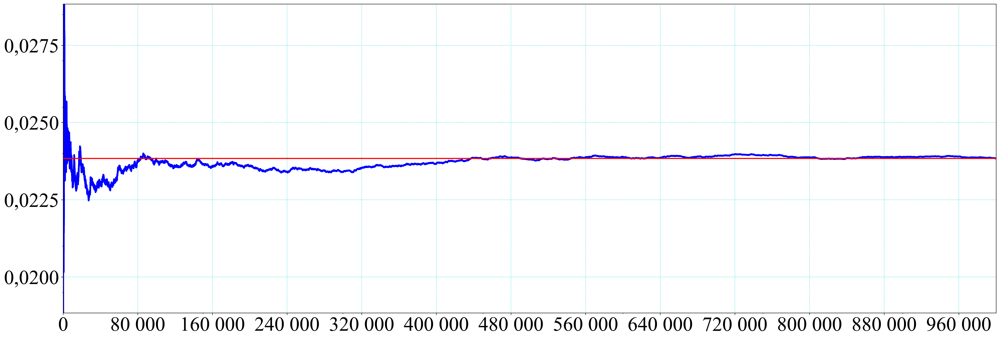

0.023838023838023838


In [5]:


counter = 0
N=10**6
x = np.array(np.arange(1,N))
y = np.array(np.zeros(N-1))

for i in tqdm(range(1,N)):
  c = ''.join(list(np.random.choice(mix, 10, replace = False)))
  c1 = c.count('WW')
  if c1 == 0:
    counter+=1
  y[i-1] = counter/i
make_plot(counter,x,y,N)
print(counter/i)

## B – все мужчины сидят рядом

  0%|          | 0/999999 [00:00<?, ?it/s]

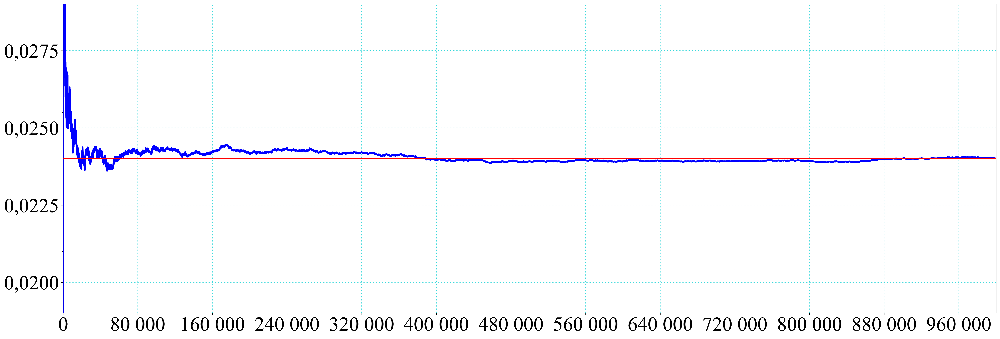

0.02401102401102401


In [6]:
mix =  np.array(['M'] * 5 + ['W'] * 5)
counter = 0
N=10**6
x = np.array(np.arange(1,N))
y = np.array(np.zeros(N-1))

for i in tqdm(range(1,N)):
  c = ''.join(list(np.random.choice(mix, 10, replace = False)))
  c1 = c.count('MMMMM')
  if c1 == 1:
    counter+=1
  y[i-1] = counter/i
make_plot(counter,x,y,N)
print(counter/i)

# 2.18

## а)

  0%|          | 0/999999 [00:00<?, ?it/s]

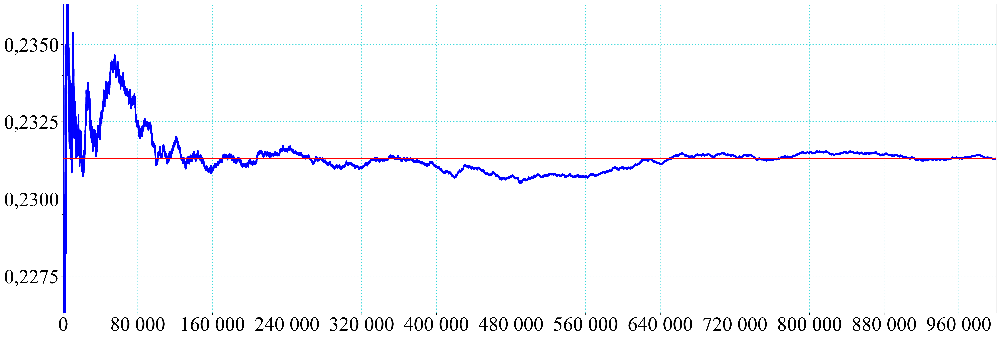

0.2313122313122313


In [7]:
omega = np.array(['0'] * 3 + ['1'] * 7)
N = 10**6
counter = 0
x = np.array(np.arange(1,N))
y = np.array(np.zeros(N-1))

for i in tqdm(range(1,N)):
  c = np.random.choice(omega, 1, replace = True)
  cntr = 1
  while(c[0] == '0'):
    c = np.random.choice(omega, 1, replace = True)
    cntr+=1
  if (cntr%2==0):
    counter +=1

  y[i-1] = counter/i
  
make_plot(counter,x,y,N)
print(counter/i)

## б)

  0%|          | 0/999999 [00:00<?, ?it/s]

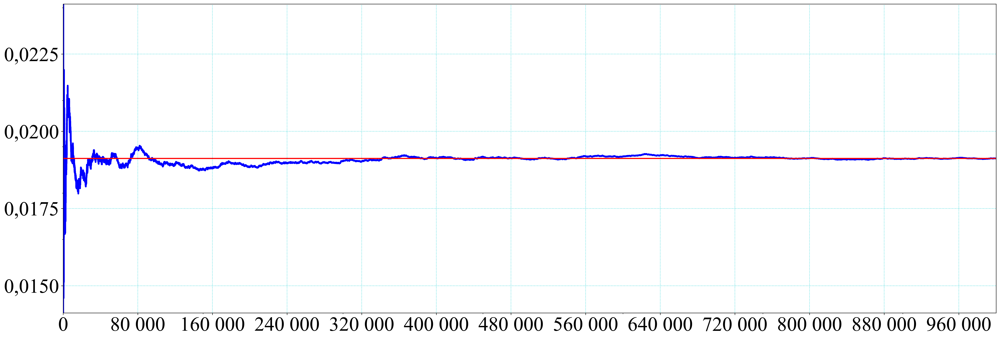

0.01912101912101912


In [17]:
omega = np.array(['0'] * 3 + ['1'] * 7)
N = 10**6
counter = 0
x = np.array(np.arange(1,N))
y = np.array(np.zeros(N-1))

for i in tqdm(range(1,N)):
  c = np.random.choice(omega, 1, replace = True)
  cntr = 1
  while(c[0] == '0'):
    c = np.random.choice(omega, 1, replace = True)
    cntr+=1
  if (cntr%4==0):
    counter +=1

  y[i-1] = counter/i
  
make_plot(counter,x,y,N)
print(counter/i)

# 3.1

## Аналитика
Будем считать, что сейчас ровно 14:00. Тогда по условию задачи $0 \leqslant x, y \leqslant 1$.   
Тогда благоприятное событие если: $x - \frac{10}{60} \leqslant y \leqslant x; x \leqslant y \leqslant x + \frac{12}{60}$  
 $|\Omega| = 1 \cdot 1 = 1$;   
 $|A| = 1 - \frac{25}{72} - \frac{8}{25} \approx 0,3328$.   
Ответ: $\mathbb P(A) \approx \frac{0,3328}{1} = 0,3328$

  0%|          | 0/100000 [00:00<?, ?it/s]

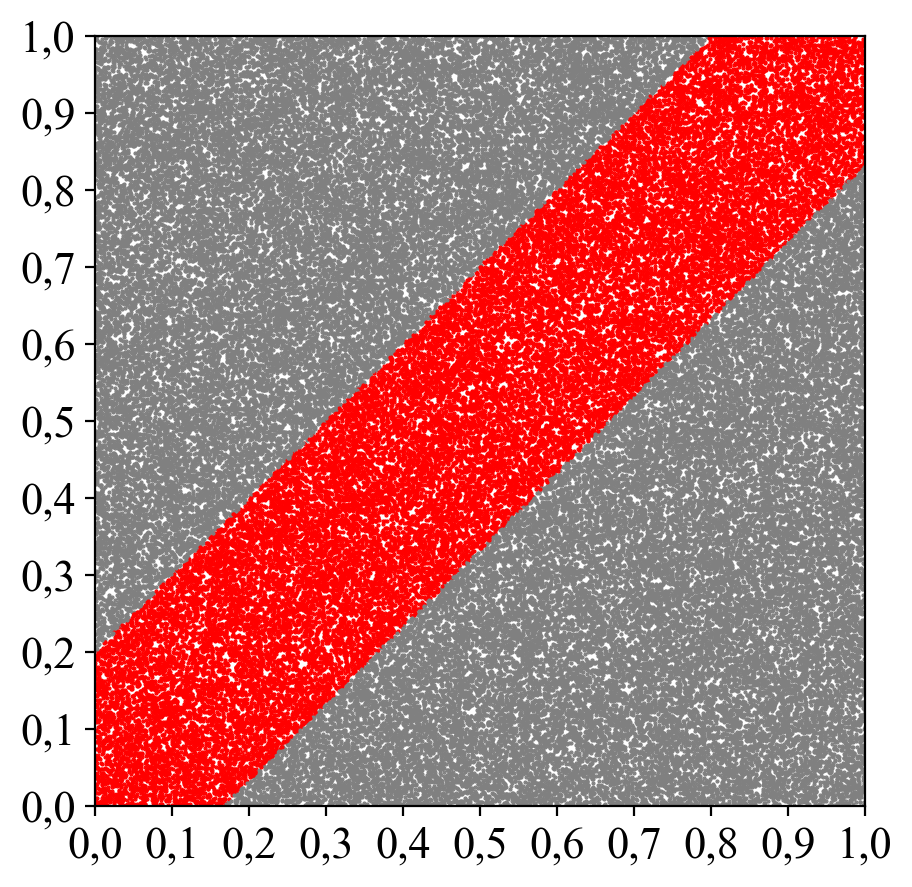

  0%|          | 0/1000000 [00:00<?, ?it/s]

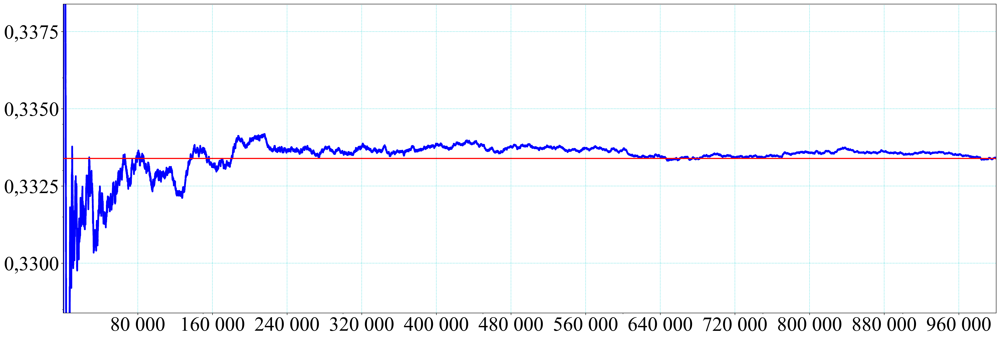

0.333391


In [9]:
cond = (lambda x,y:  (x - 1/6 <= y <= x) or (x <= y <= x + 1/5) )
plot_geom(cond,N=100000)
plot_stat(cond)

# 3.2

## A

### Аналитика
Будем считать, что сейчас ровно 11:00. Тогда по условию задачи $0 \leqslant x, y \leqslant 1$.   
Тогда благоприятное событие если: $x - \frac{15}{60} \leqslant y \leqslant x; x \leqslant y \leqslant x + \frac{15}{60}$  
 $|\Omega| = 1 \cdot 1 = 1$;   
 $|A| = 1 - \frac{9}{16} \approx 0,4375$.   
Ответ: $\mathbb P(A) \approx \frac{0,4375}{1} = 0,4375$

### Графическая интерпритация устойчивости и статистической вероятности

  0%|          | 0/100000 [00:00<?, ?it/s]

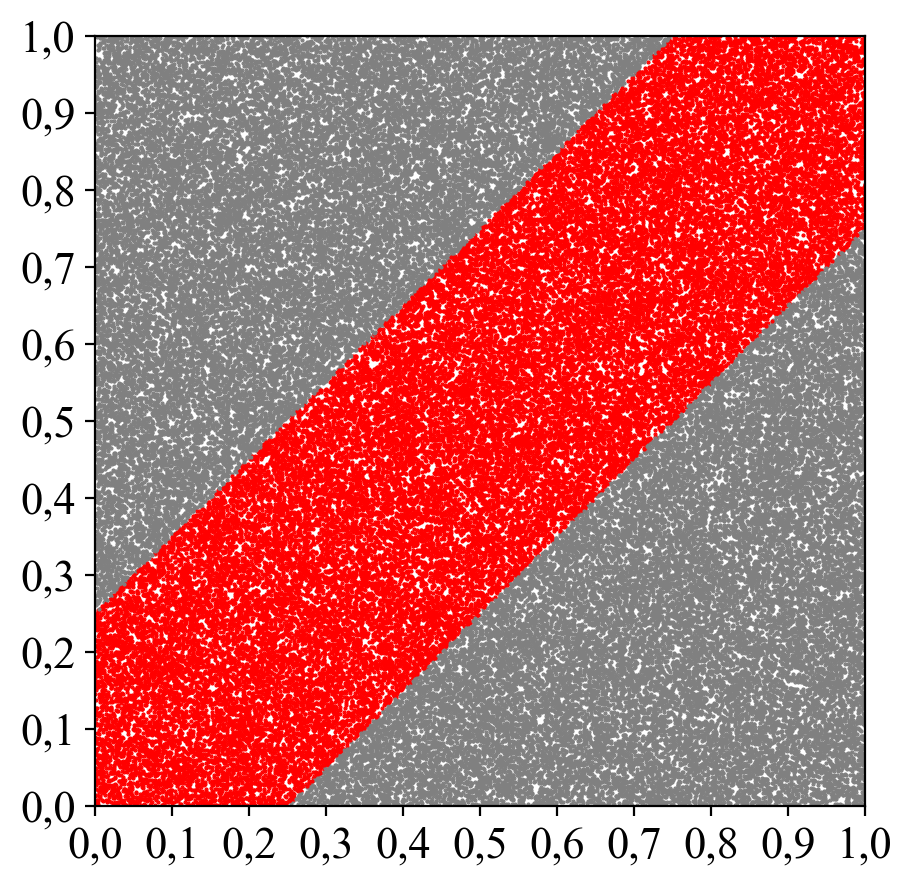

  0%|          | 0/1000000 [00:00<?, ?it/s]

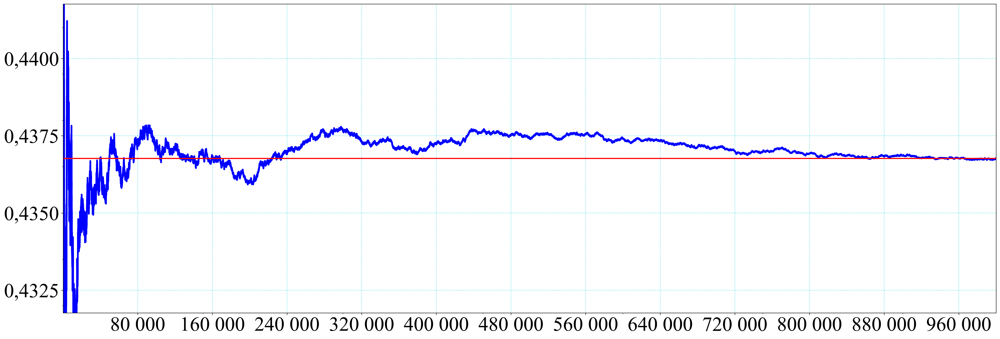

0.436766


In [10]:
cond = (lambda x,y:  (x - 1/4 <= y <= x) or (x <= y <= x + 1/4) )
plot_geom(cond,N=100000)
plot_stat(cond)

## B

### Аналитика
Будем считать, что сейчас ровно 11:00.Посчитаем вероятность того, что они встретятся, используя пункт А:
Тогда по условию задачи $0 \leqslant x, y \leqslant 1$.   
Тогда благоприятное событие если: $x - \frac{15}{60} \leqslant y \leqslant x; x \leqslant y \leqslant x + \frac{15}{60}$  
 $|\Omega| = 1 \cdot 1 = 1$;   
 $|A| = 1 - \frac{9}{16} \approx 0,4375$.   
 $\mathbb P(A) \approx \frac{0,4375}{1} = 0,4375$

Вероятность события B:

$|B| = 1 - |A|$

Ответ: $\mathbb P(B) \approx \frac{1 - 0,4375}{1} = 0,5625$

### Графическая интерпритация устойчивости и статистической вероятности

  0%|          | 0/100000 [00:00<?, ?it/s]

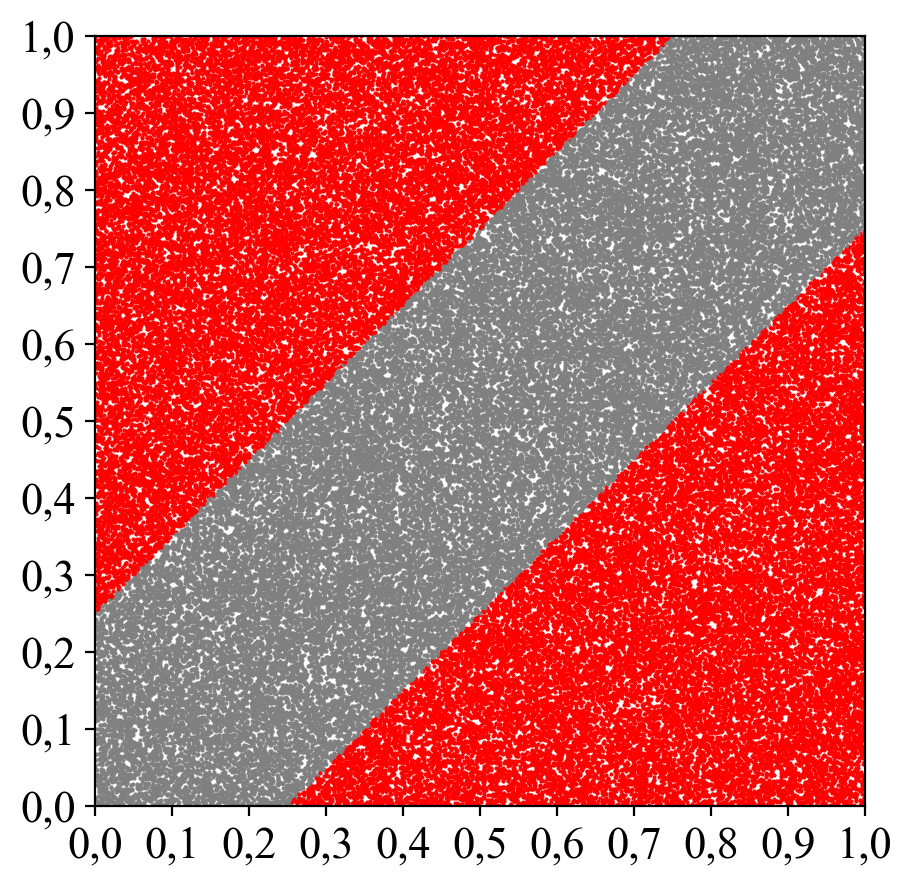

  0%|          | 0/1000000 [00:00<?, ?it/s]

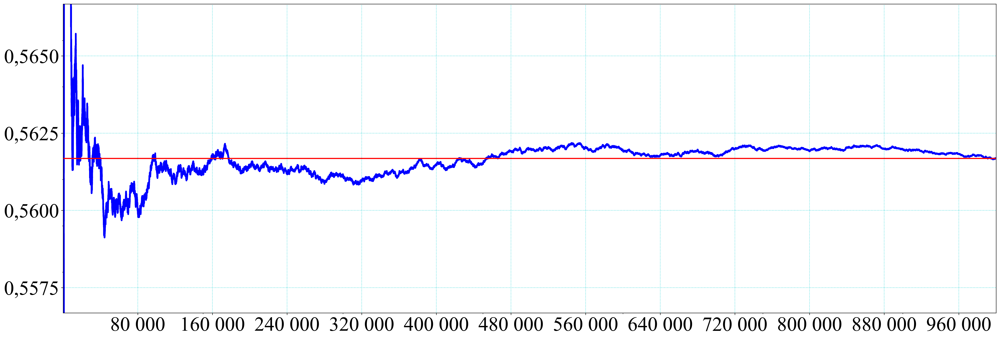

0.561681


In [11]:
cond = (lambda x,y: not( (x - 1/4 <= y <= x) or (x <= y <= x + 1/4) ))
plot_geom(cond,N=100000)
plot_stat(cond)

## C

### Аналитика
Будем считать, что сейчас ровно 11:00. Тогда по условию задачи $0 \leqslant x, y \leqslant 1$.   
Тогда благоприятное событие если: $x - \frac{15}{60} \leqslant y \leqslant x; x = y $  
 $|\Omega| = 1 \cdot 1 = 1$;   
 $|C| = 1 - \frac{1}{2} - \frac{9}{32} \approx 0,21875$.   
Ответ: $\mathbb P(C) \approx \frac{0,21875}{1} = 0,21875$

### Графическая интерпритация устойчивости и статистической вероятности

  0%|          | 0/100000 [00:00<?, ?it/s]

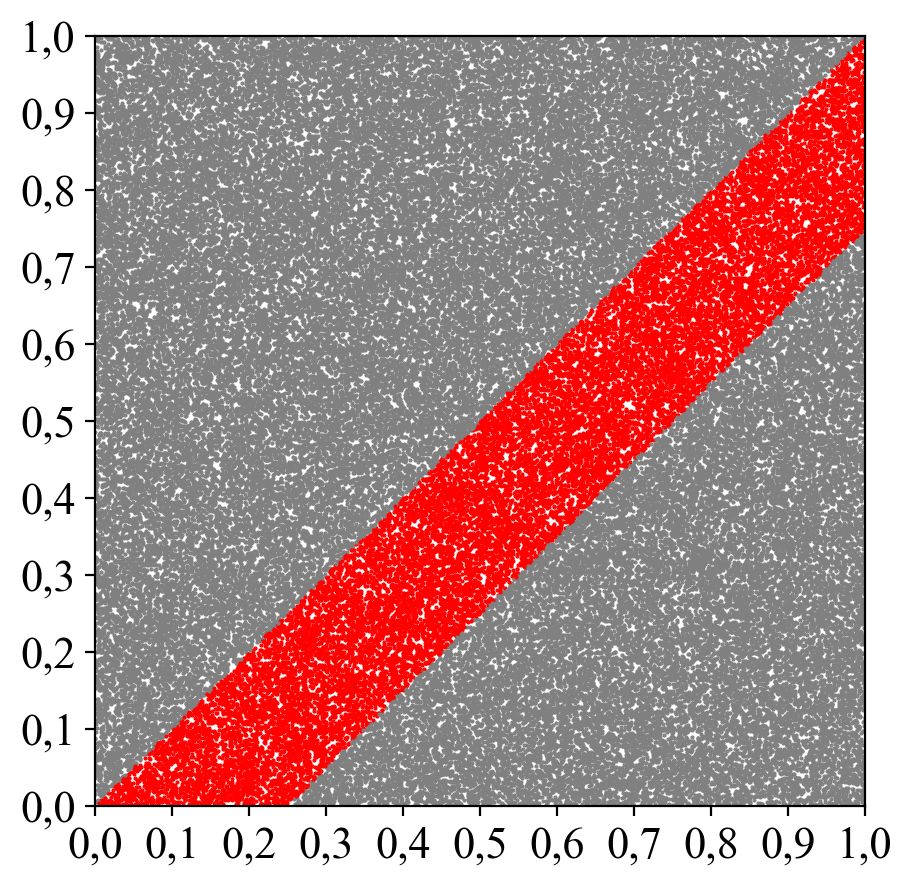

  0%|          | 0/1000000 [00:00<?, ?it/s]

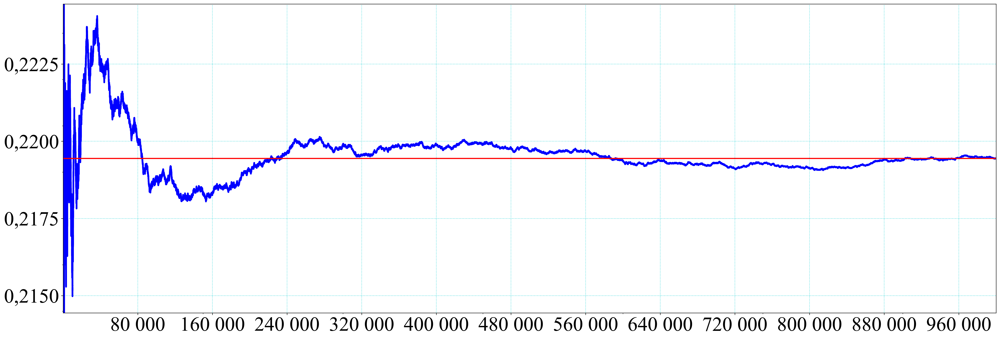

0.219443


In [12]:
cond = (lambda x,y:  (x - 1/4 <= y <= x) or (x == y) )
plot_geom(cond,N=100000)
plot_stat(cond)

## D

### Аналитика
Будем считать, что сейчас ровно 11:00. Тогда по условию задачи $0 \leqslant x, y \leqslant 1$.   
Тогда благоприятное событие если: $x - \frac{15}{60} \leqslant y \leqslant x; x \leqslant y \leqslant x + \frac{15}{60}$  
 $|\Omega| = 1 \cdot 1 = 1$;   
 $|D| = 1 - \frac{3}{4} -  \frac{1}{16} \approx 0,1875$.   
Ответ: $\mathbb P(D) \approx \frac{0,1875}{1} = 0,1875$

### Графическая интерпритация устойчивости и статистической вероятности

  0%|          | 0/100000 [00:00<?, ?it/s]

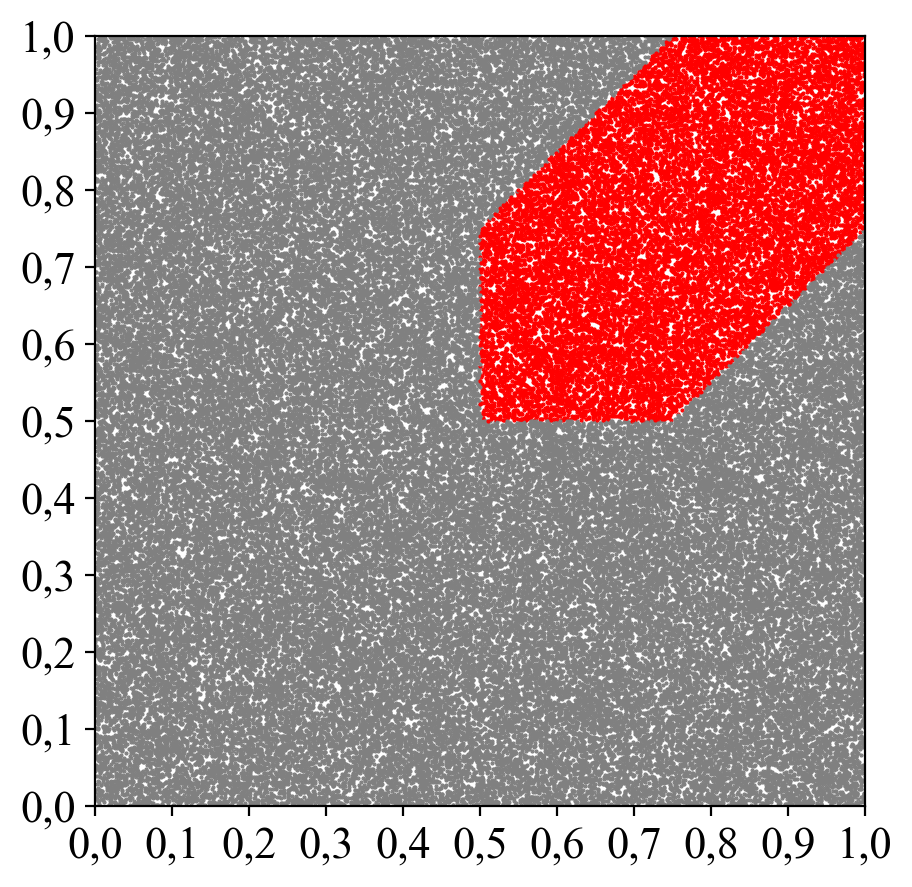

  0%|          | 0/1000000 [00:00<?, ?it/s]

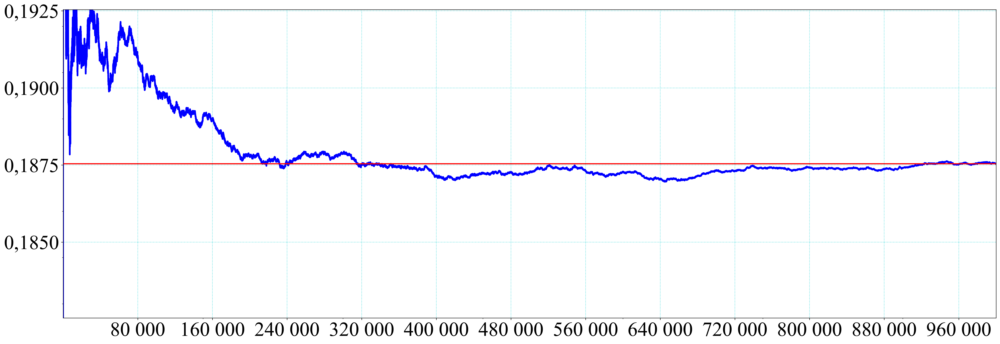

0.18754


In [13]:
cond = (lambda x,y:  ((0.5 <= y <= x) or (0.5 <= x <= y)) and ((x - 1/4 <= y <= x) or (x <= y <= x + 1/4) ))
plot_geom(cond,N=100000)
plot_stat(cond)

## E

### Графическая интерпритация устойчивости и статистической вероятности

  0%|          | 0/100000 [00:00<?, ?it/s]

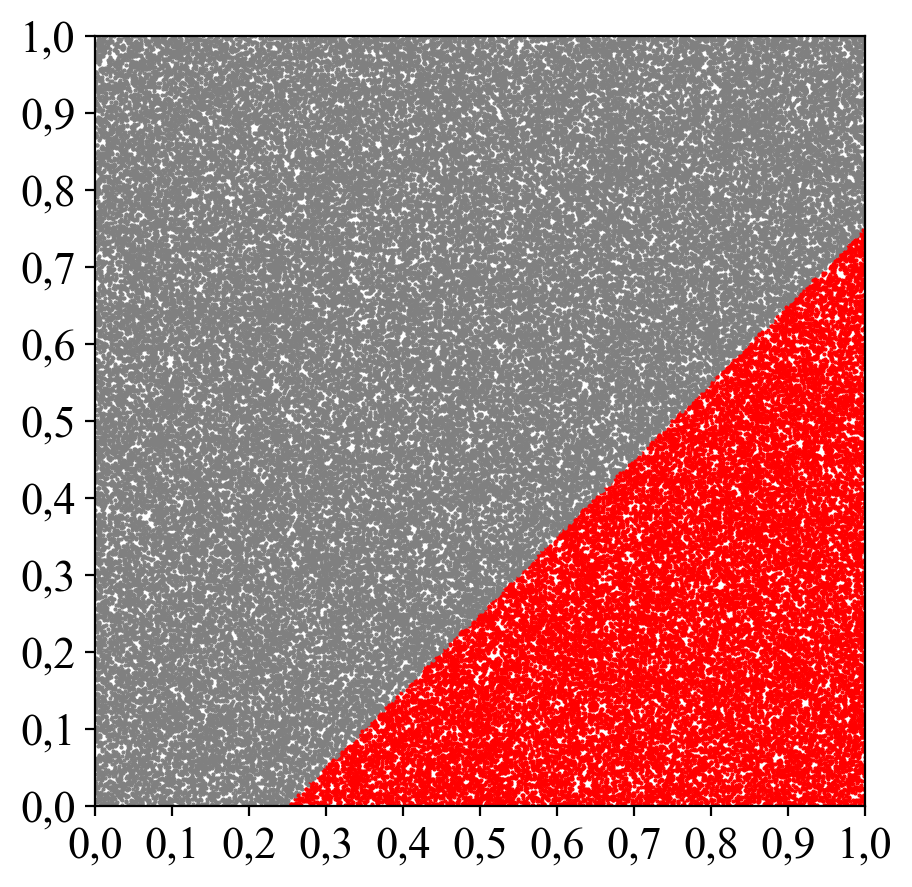

  0%|          | 0/1000000 [00:00<?, ?it/s]

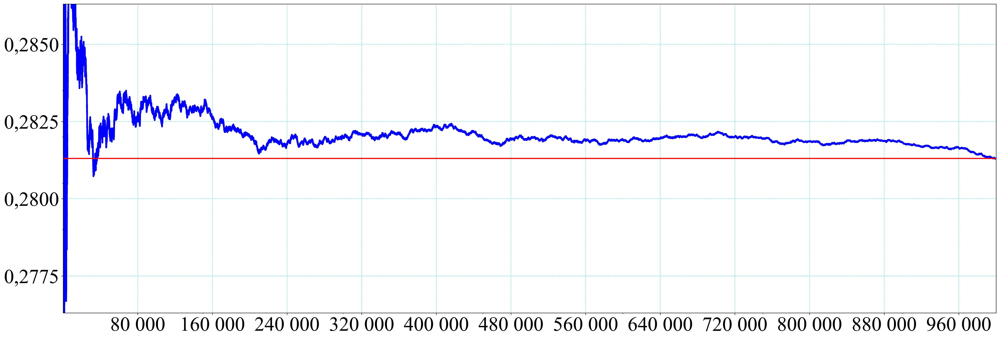

0.281304


In [11]:
cond = (lambda x,y: not ((x-y <=1/4)) )
plot_geom(cond,N=100000)
plot_stat(cond)

## F

### Графическая интерпритация устойчивости и статистической вероятности

  0%|          | 0/1000000 [00:00<?, ?it/s]

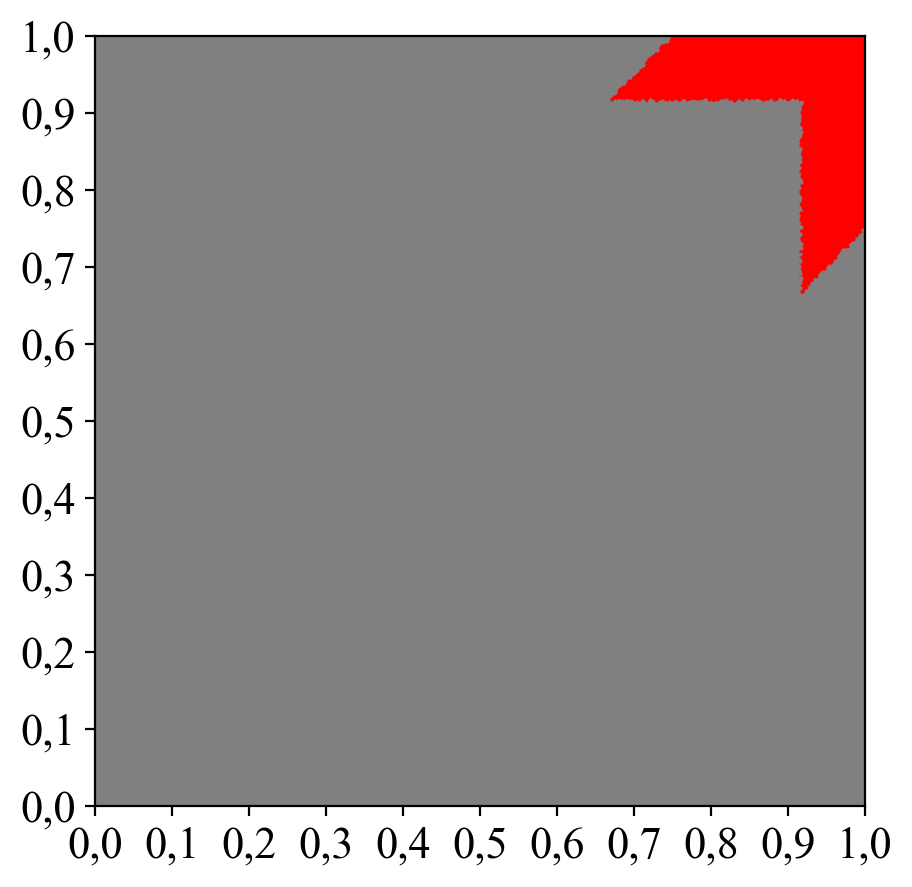

  0%|          | 0/1000000 [00:00<?, ?it/s]

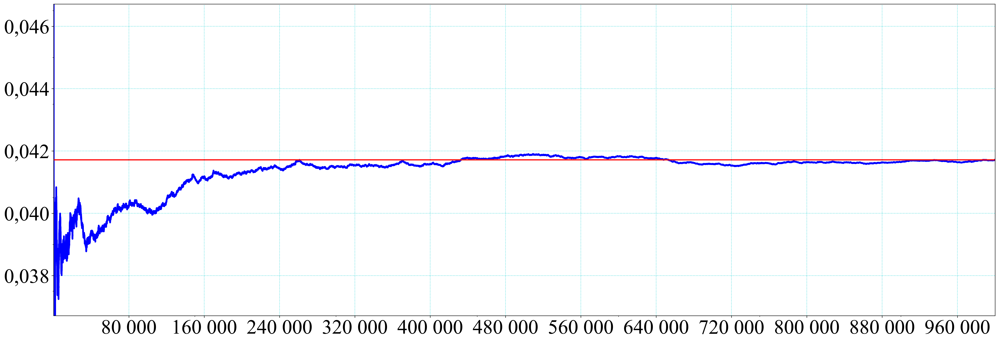

0.041715


In [16]:
cond = (lambda x,y:  ((55/60 <= x - 1/4 <= y ) or (55/60<= y <= x + 1/4) or (55/60 <= y - 1/4 <= x ) or (55/60<= x <= y + 1/4)))
plot_geom(cond,N=1000000)
plot_stat(cond)

# 3.3

На отрезке [a, b], лежащем на числовой оси, наудачу выбирается первая
точка с координатой x, после чего на отрезке [a, x] наудачу выбирается вторая точка с координатой . Найдите вероятности следующих событий: A –
вторая точка ближе к b, чем первая к a; B – расстояние между точками x
и y меньше половины длины отрезка; C – первая точка ближе ко второй,
чем к точке b.
Найти соответствующие статистические вероятности и показать статистическую устойчивость вероятности в зависимости от числа экспериментов N

## A

### Аналитика

Пусть $ x$ - расстояние  $[a;x]$, а $y$ - расстояние  $[y;x]$
<br>Для удобства возьмем, что $а = 0$, а $b = 1$, так что $0 \leqslant x \leqslant 1$, а y - часть от 0 до x, так что ее можно взятьв долях единицы, вот и получается, что
<br>$0 \leqslant x \leqslant 1$
<br>$0 \leqslant y \leqslant x$
<br>$ 1 - x \leqslant y$

### Графическая интерпритация устойчивости и статистической вероятности

  0%|          | 0/100000 [00:00<?, ?it/s]

0.5002


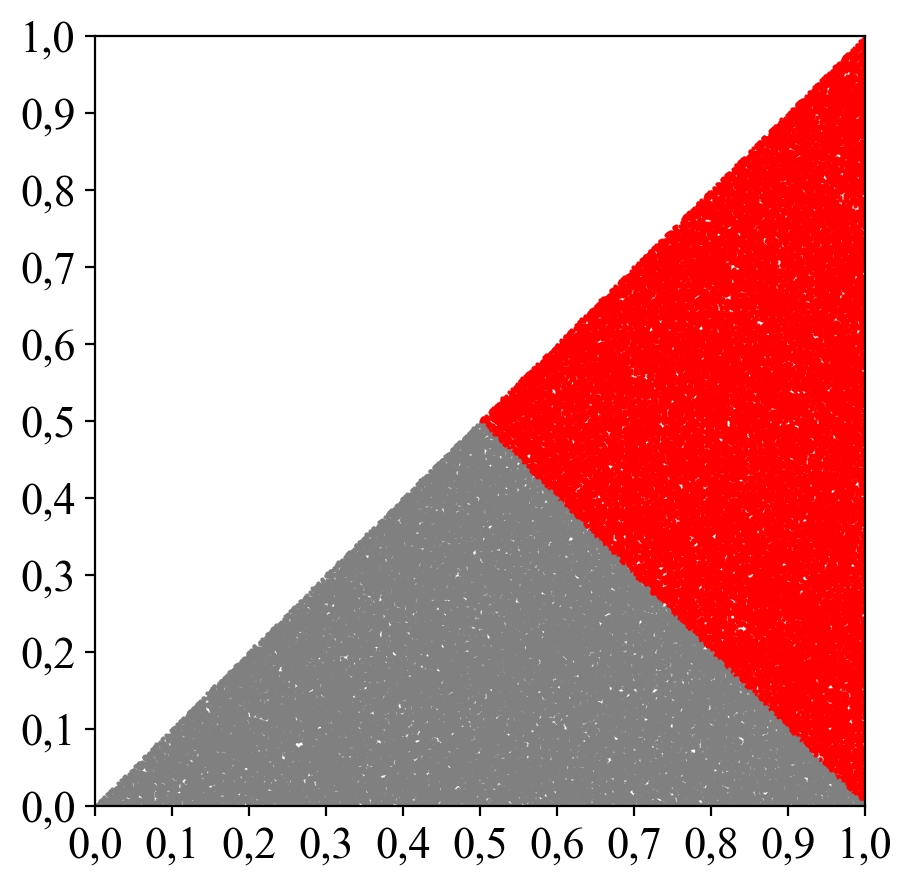

In [29]:
cond1 = (lambda x,y:  (y>=1-x and y<=x) )
cond2 = (lambda x,y:   y<=x)
cond = (lambda x,y:  (y>=1-x) )
plot_geom(cond1,N=100000,reverse=1)

## B

  0%|          | 0/100000 [00:00<?, ?it/s]

0.74913


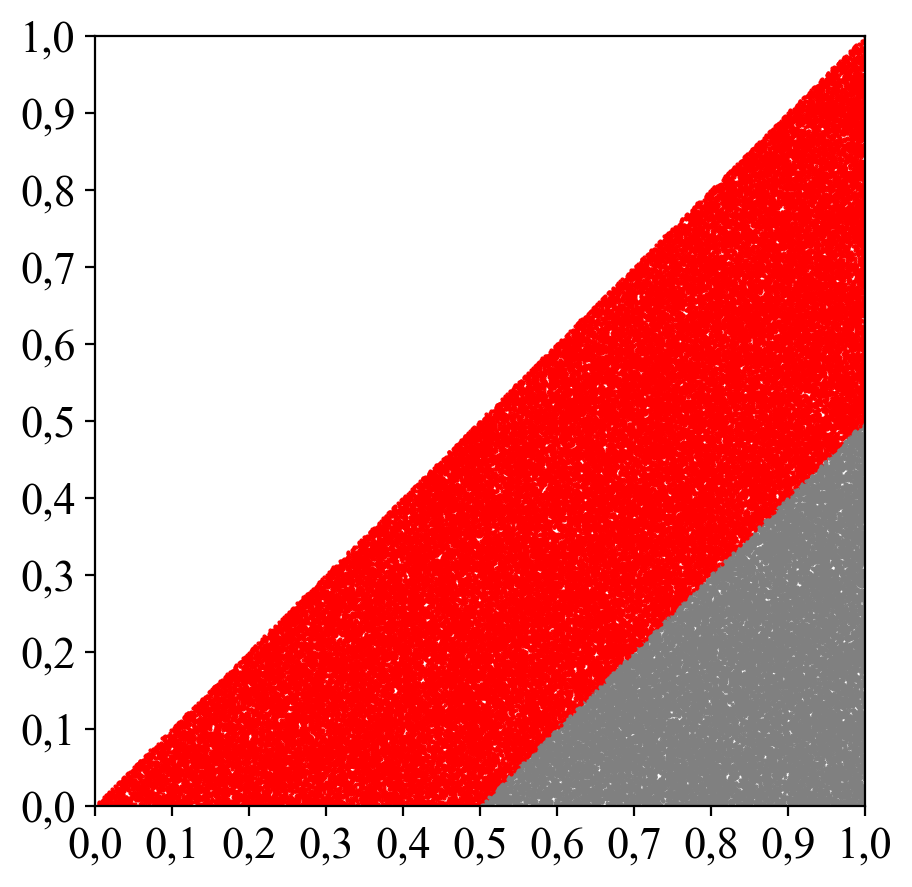

  0%|          | 0/1000000 [00:00<?, ?it/s]

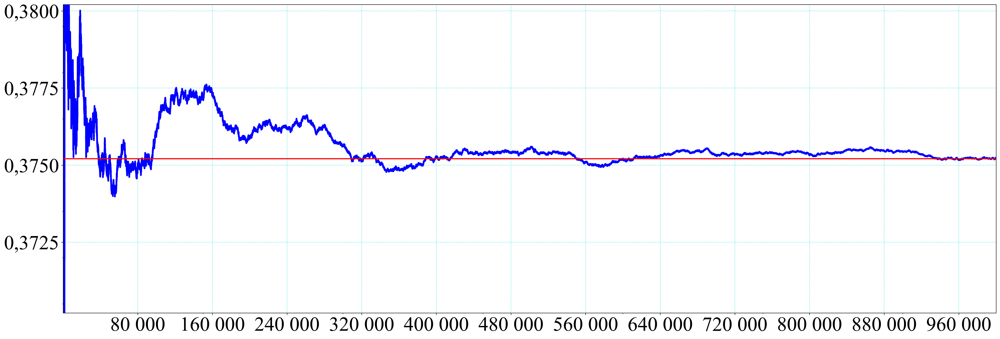

0.375207


In [32]:
cond = (lambda x,y:  (x>=y) and (x-y<=0.5))
plot_geom(cond,N=100000,reverse=1)
plot_stat(cond)

## C

  0%|          | 0/100000 [00:00<?, ?it/s]

0.49778


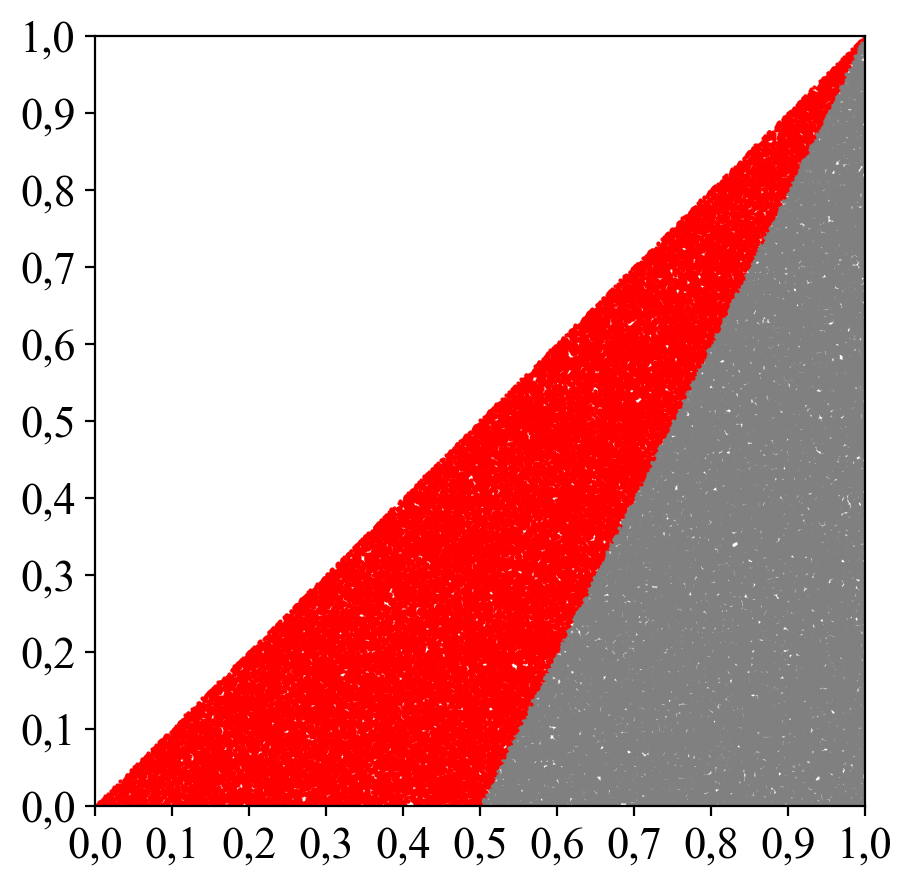

  0%|          | 0/1000000 [00:00<?, ?it/s]

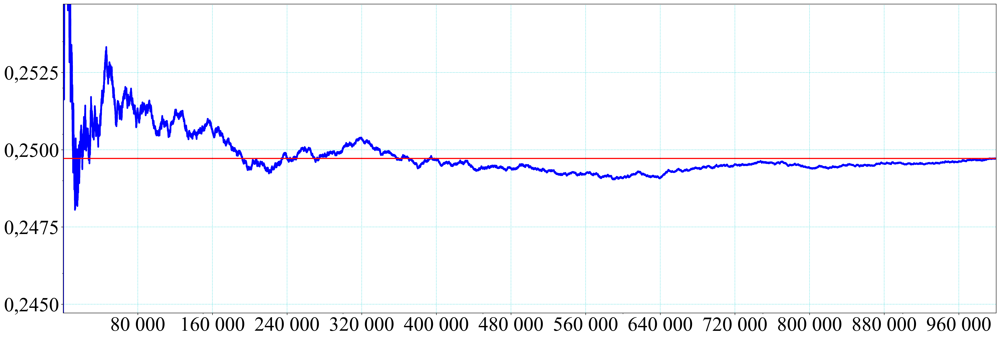

0.249718


In [30]:
cond = (lambda x,y:  (x>=y) and (x-y<=1-x))
plot_geom(cond,N=100000,reverse=1)
plot_stat(cond)

# 3.4

  0%|          | 0/1000000 [00:00<?, ?it/s]

0.012602


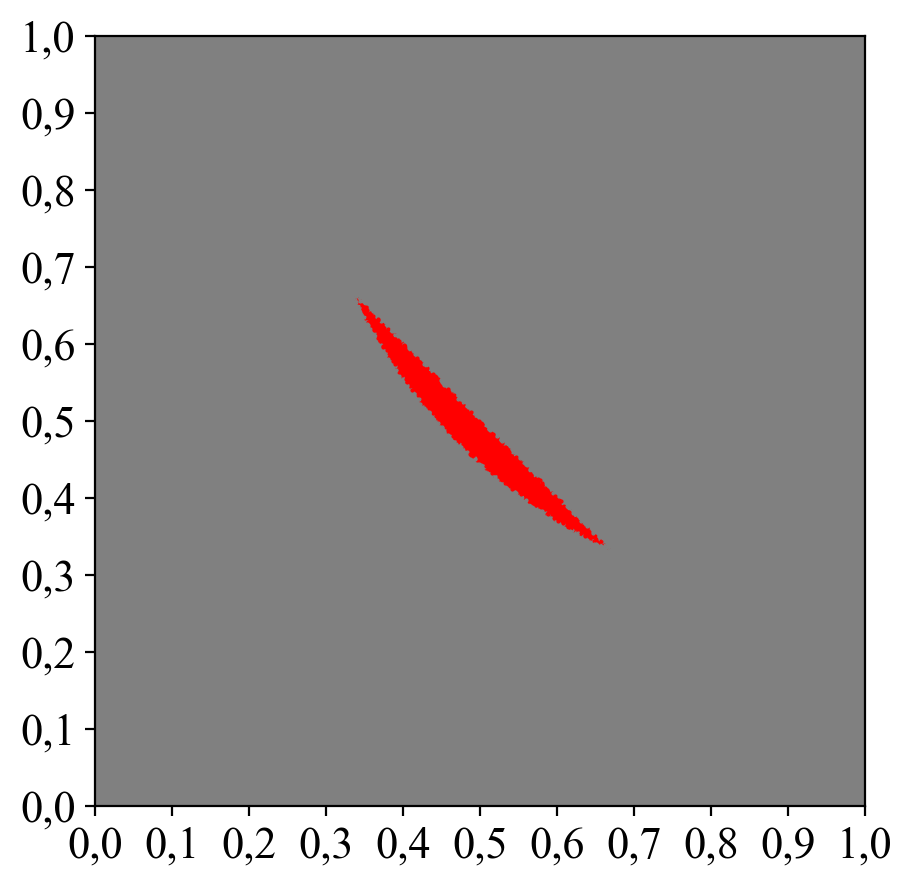

  0%|          | 0/1000000 [00:00<?, ?it/s]

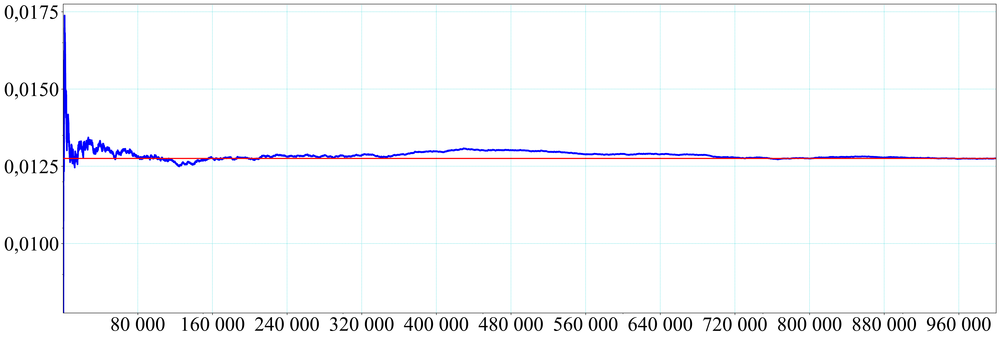

0.012752


In [37]:
cond = (lambda x,y:  (x+y<=1) and (x*y>=2/9))
plot_geom(cond,N=1000000)
plot_stat(cond)

# 3.5

  0%|          | 0/100000 [00:00<?, ?it/s]

0.07781


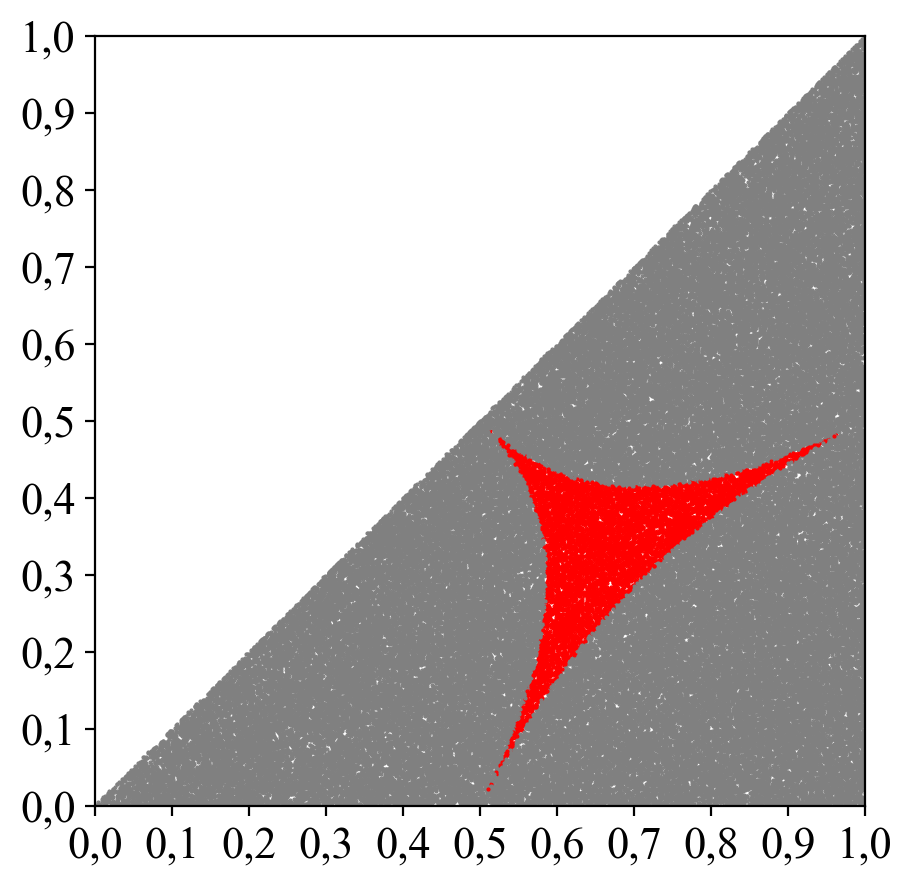

  0%|          | 0/1000000 [00:00<?, ?it/s]

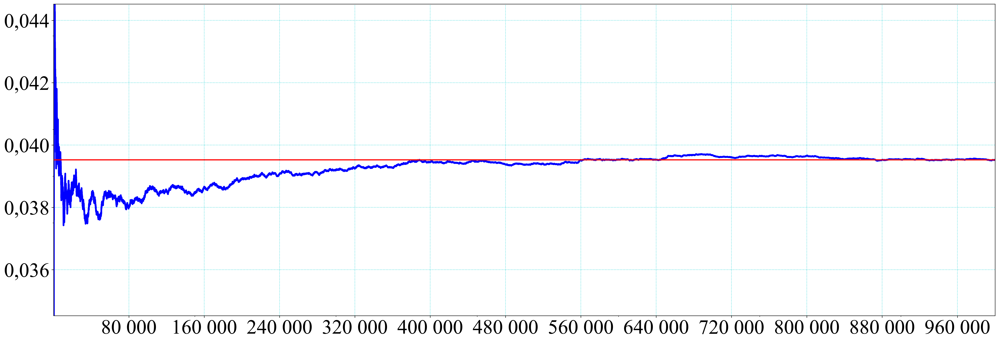

0.039523


In [35]:
cond = (lambda x,y: (y<=x) and (x>=0.5) and (y<=0.5) and  (x<=y+1/2) and  (x - y)**2 + (1 - x)**2 >= y**2 and  y**2 + (1 - x)**2 >= (x - y)**2 and (x - y)**2 +y**2  >= (1 - x)**2)
plot_geom(cond,N=100000,reverse=1)
plot_stat(cond)

# 3.6

  0%|          | 0/100000 [00:00<?, ?it/s]

  0%|          | 0/78763 [00:00<?, ?it/s]

KeyboardInterrupt: 

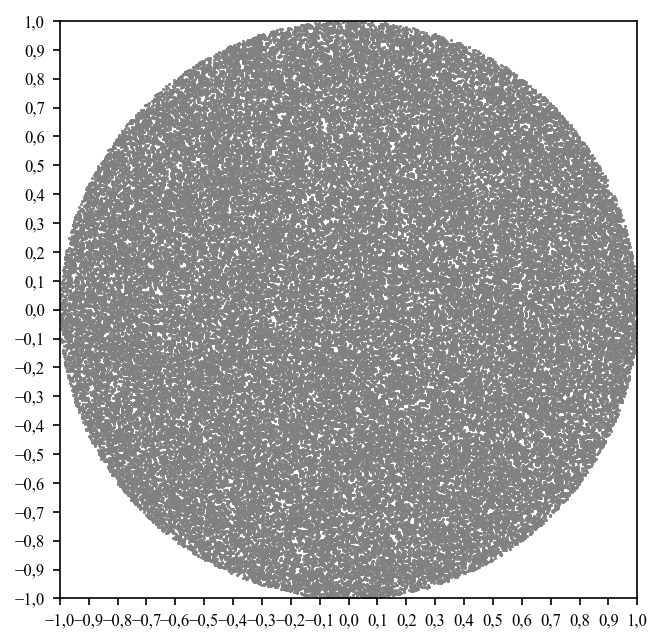

In [6]:
import random
N=10**5
rcParams['figure.figsize'] = (5, 5)
rcParams['figure.dpi'] = 150
fig,ax =plt.subplots(figsize=(5, 5))
plt.tick_params(labelsize = 8)
ax.xaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
plt.xlim(-1,1)
plt.ylim(-1,1)
ax.set_aspect('equal', adjustable='box')
count=0
d=[]
for i in tqdm(range(N)):
    x = random.uniform(-1,1)
    y = random.uniform(-1,1)
    if x**2 +y**2 <=1: 
        plt.plot(x,y,marker='.', markersize=1,color ='gray')
        d.append((x,y))
sets=set()
for i in tqdm(range(len(d))):
    for j in (range(len(d)-1)):
        sets.add((d[i],d[j]))
        if (d[i],d[j]) in sets or (d[j],d[i]) in sets:
            continue
        if (((d[i][0]-d[j][0])**2 + (d[i][1]-d[j][1])**2  )**0.5)<=1:
            plt.plot(d[i],d[j],marker='o', markersize=1,color ='r')
            count+=1
pstat = count/N
print(pstat)
plt.show()